# Plot interactive earthquake data using holoviews

This notebook downloads earthquake data from the USGS database and plots it using holoviews. Holoviews is wrapper around the bokeh framework that does alot of the heavy lifting for you. Similar to Bokeh, it also allows for stand alone HTML code that can be embeded into a webpage, but you can also write apps that run on their server.

This code is largely based on http://examples.holoviews.org/Earthquake_Visualization.html

#### Warning: May need to clear kernel each time you want to rerun!

In [1]:
from bokeh.io import output_file, show
import holoviews as hv
from holoviews import dim, opts
import datetime as dt
import numpy as np
import pandas as pd
from matplotlib.image import imread
from mpl_toolkits.basemap import Basemap
import pandas as pd

from io import BytesIO
import requests

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
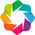

In [2]:
# hv.notebook_extension('bokeh', width=90)
hv.extension('bokeh')
renderer = hv.renderer('bokeh')


## Download data from USGS (limit of 20,000 earthquakes)

In [9]:
query = dict(starttime="2015-05-13", endtime="2020-05-13", minmagnitude="5.0")
query_string = '&'.join('{0}={1}'.format(k, v) for k, v in query.items())
query_url = "http://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&" + query_string
response = requests.get(query_url)
df = pd.read_csv(BytesIO(response.content),
                 parse_dates=['time'], index_col='time',
                 infer_datetime_format=True,
                 )
df['Date'] = [str(t)[:19] for t in df.index]
# Make longitude between 0 and 360 instead of -180 to 180
df['longitude'][df['longitude'] < 0] = df['longitude'][df['longitude'] < 0] + 360
df.head()


/Users/russell/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,net,...,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource,Date
time,,,,,,,,,,,,,,,,,,,,,
2020-05-12 22:41:12.954,-12.1059,166.5694,112.36,6.6,mww,NaN,24.0,3.377,1.39,us,...,"173km SSE of Lata, Solomon Islands",earthquake,7.6,5.4,0.058,29.0,reviewed,us,us,2020-05-12 22:41:12
2020-05-12 15:10:34.236,-10.6255,281.8021,79.66,5.0,mb,NaN,181.0,1.897,0.58,us,...,"40km W of Paramonga, Peru",earthquake,12.6,6.1,0.033,284.0,reviewed,us,us,2020-05-12 15:10:34
2020-05-11 01:06:18.684,-6.0661,129.9186,10.00,5.6,mww,NaN,41.0,2.345,0.91,us,...,"259km NW of Saumlaki, Indonesia",earthquake,6.5,1.8,0.071,19.0,reviewed,us,us,2020-05-11 01:06:18
2020-05-10 23:58:33.823,36.3778,141.1503,31.00,5.8,mww,NaN,26.0,0.788,0.75,us,...,"49km E of Oarai, Japan",earthquake,4.1,1.8,0.051,37.0,reviewed,us,us,2020-05-10 23:58:33
2020-05-10 18:04:22.484,-22.7535,291.8422,117.94,5.5,mww,NaN,88.0,0.198,1.06,us,...,"19km NNE of San Pedro de Atacama, Chile",earthquake,8.4,7.2,0.063,24.0,reviewed,us,us,2020-05-10 18:04:22


## Set up map structure

Export NASA's blue marble (https://visibleearth.nasa.gov/collection/1484/blue-marble) to holoviews RGB structure to use as plot background.

In [4]:
kdims = ['Longitude', 'Latitude']
map = Basemap(llcrnrlon=0,llcrnrlat=-90.,urcrnrlon=359.9,urcrnrlat=90)
img = map.bluemarble()
imgss = np.flipud(img.get_array()[::5, ::5])
lon = np.linspace(img.get_extent()[0],img.get_extent()[1],imgss.shape[1])
lat = np.linspace(img.get_extent()[2],img.get_extent()[3],imgss.shape[0])
rgb = img.get_array()[::5, ::5]
blue_marble = hv.RGB((lon,lat,rgb[:,:,0],rgb[:,:,1],rgb[:,:,2]),
                     kdims=kdims)

/Users/russell/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3310: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/russell/anaconda/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3319: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


## Pass the earthquake dataframe into the HoloViews Element
kdims: independent variables  
vdims: dependent variables

In [5]:
# Pass the earthquake dataframe into the HoloViews Element. Call it "earthquakes"
earthquakes = hv.Points(df, kdims=['longitude', 'latitude'],
                        vdims=['place', 'Date', 'depth', 'mag'],
                        group='Earthquakes')


## Plot global seismicity as circles colored by depth with circle size corresponding to magnitude


In [6]:
# Style Plots
%opts Points.Earthquakes [responsive=True data_aspect=1 scaling_factor=1.5 colorbar=True toolbar='above' clabel='Depth (km)' tools=['hover', 'crosshair']] (color='depth' cmap='cool' size=1+1.2**(dim('mag')**1.3))

# Plot blue marble first, then earthquakes
# The " * " opperator overlays components and the " + " creates two separate figures
plot1 = blue_marble * earthquakes.opts(title="Earthquakes > M5.0 (2015-2020)")

# Convert to bokeh figure then save using bokeh (Hugo likes the bokeh HTML better!)
bplot1 = renderer.get_plot(plot1).state
output_file('a1_global_seismicity.html')
show(bplot1)


## Explore magnitude-depth relationships with brushing and linking

Data in the two figures are linked. Selecting earthquakes in the map will highlight them in magnitude-depth space. It also works the other way around – select earthquakes of a desired magnitude and depth to see where they occur on the map.


In [7]:
# Need to import DataLink to connect the data in the two plots
from holoviews.plotting.links import DataLink
# Redefine earthquakes to avoid styling conflicts with the earlier one...
earthquakes2 = hv.Points(df, kdims=['longitude', 'latitude'],
                        vdims=['place', 'Date', 'depth', 'mag'],
                        group='Earthquakes2')
%opts Points.Earthquakes2 [scaling_factor=1.5] (size=1+1.2**(dim('mag')**1.3))
%opts Points [height=int(250*1.3) width=int(400*1.3) tools=['hover', 'lasso_select', 'box_select', 'crosshair'] active_tools=['lasso_select']] (color='indianred', alpha=0.4, nonselection_color='indianred', selection_alpha=0.75, selection_color='deepskyblue')

# Make magnitude-depth object
mag_depth = hv.Points(earthquakes2, kdims=['mag','depth'], group='Earthquake magnitude vs. depth').opts(size=10, xlabel='Magnitude')

# Link the data in the two objects
DataLink(earthquakes2,mag_depth)

# Make plot
plot2 = (blue_marble * earthquakes2.opts(title="Earthquakes > M5.0 (2015-2020)") + mag_depth.hist(dimension=['depth'])).cols(1)

# Convert to bokeh figure then save using bokeh (Hugo likes the bokeh HTML better!)
bplot2 = renderer.get_plot(plot2).state
output_file('a1_globalEQ_MagDepth.html')
show(bplot2)
